In [154]:
# Don't change this cell; just run it. 

import numpy as np
from datascience import *
import matplotlib
%matplotlib inline
import matplotlib.pyplot as plots
plots.style.use('fivethirtyeight')
from sklearn.preprocessing import StandardScaler

import pandas as pd

from sklearn.metrics import confusion_matrix
from sklearn.datasets import load_iris
from sklearn import tree

from mlxtend.plotting import plot_confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

In [155]:
train=pd.read_csv('train_2v.csv')
train

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,30669,Male,3.0,0,0,No,children,Rural,95.12,18.0,NaN,0
1,30468,Male,58.0,1,0,Yes,Private,Urban,87.96,39.2,never smoked,0
2,16523,Female,8.0,0,0,No,Private,Urban,110.89,17.6,NaN,0
3,56543,Female,70.0,0,0,Yes,Private,Rural,69.04,35.9,formerly smoked,0
4,46136,Male,14.0,0,0,No,Never_worked,Rural,161.28,19.1,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...
43395,56196,Female,10.0,0,0,No,children,Urban,58.64,20.4,never smoked,0
43396,5450,Female,56.0,0,0,Yes,Govt_job,Urban,213.61,55.4,formerly smoked,0
43397,28375,Female,82.0,1,0,Yes,Private,Urban,91.94,28.9,formerly smoked,0
43398,27973,Male,40.0,0,0,Yes,Private,Urban,99.16,33.2,never smoked,0


In [156]:
usa=train.drop(columns=['id','ever_married','work_type','Residence_type','avg_glucose_level','stroke'])

usa.loc[usa['smoking_status'] == 'formerly smoked', 'smoking_status'] = 1
usa.loc[usa['smoking_status'] == 'smokes', 'smoking_status'] = 1
usa.loc[usa['smoking_status'] == 'never smoked', 'smoking_status'] = 0
usa.loc[pd.isnull(usa['smoking_status']), 'smoking_status'] = 0
usa.loc[usa['gender'] == 'Male', 'gender'] = 1
usa.loc[usa['gender'] == 'Female', 'gender'] = 0

scaler=StandardScaler()
usa_temp=scaler.fit_transform(usa[['age','bmi']])
std_usa=pd.DataFrame(usa_temp, columns=['age','bmi'])
usa['age'] = std_usa['age']
usa['bmi'] = std_usa['bmi']
#std_usa_all=pd.concat([std_usa, usa],axis=1)
usa['stroke'] = train['stroke']

usa = usa[['stroke',
 'gender',
 'age',
 'hypertension',
 'heart_disease',
 'bmi',
 'smoking_status',
 ]]

usa = usa.dropna()

usa = usa[usa.gender != 'Other']
usa

,stroke,gender,age,hypertension,heart_disease,bmi,smoking_status
0,0,1,-1.741517,0,0,-1.364882,0
1,0,1,0.700823,1,0,1.363586,0
2,0,0,-1.519486,0,0,-1.416363,0
3,0,0,1.233697,0,0,0.938871,1
4,0,1,-1.253049,0,0,-1.223311,0
...,...,...,...,...,...,...,...
43395,0,0,-1.430674,0,0,-1.055999,0
43396,0,0,0.612011,0,0,3.448547,1
43397,0,0,1.766571,1,0,0.037962,1
43398,0,1,-0.098488,0,0,0.591378,0


In [92]:
sampled_usa=usa.sample(frac=1)
training_df = sampled_usa[0:33545]
testing_df = sampled_usa[33545:]

training_df

,stroke,gender,age,hypertension,heart_disease,bmi,smoking_status
20437,0,0,-0.897799,0,0,1.067573,1
12282,0,1,-0.586956,0,0,-0.592675,0
14795,0,1,0.478792,0,0,0.321105,0
13174,0,1,-1.785923,0,0,-1.223311,0
1812,0,1,1.322509,0,0,0.218144,0
...,...,...,...,...,...,...,...
23633,0,0,-0.187301,0,0,-0.631285,0
8925,0,0,0.389980,0,0,-0.566934,0
19966,0,0,1.366916,0,0,0.488417,0
11494,0,0,0.745229,0,0,-0.708506,0


# Analysis with Decision Tree (CART)

In [100]:
type(training_df['smoking_status'][0])

numpy.int64

In [101]:
df = training_df.to_numpy()
X = df[:, 1:]
Y = df[:, 0]
Y=Y.astype('int')

In [102]:
clf = tree.DecisionTreeClassifier()
clf = clf.fit(X, Y)
clf

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

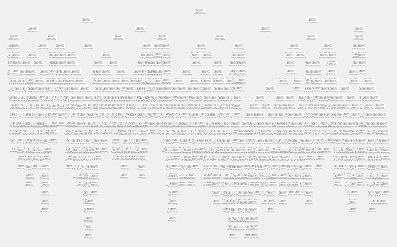

In [103]:
tree.plot_tree(clf.fit(X, Y)) 
import graphviz 

dot_data = tree.export_graphviz(clf, out_file=None,  
                      filled=True, rounded=True,  
                      special_characters=True)  
graph = graphviz.Source(dot_data) 
graph

In [104]:
from IPython.display import SVG
from graphviz import Source

graph = Source(tree.export_graphviz(clf, out_file=None,  
                      filled=True, rounded=True,  
                      special_characters=True))
graph.format = 'png'
graph.render('dtree_render',view=True)

png_bytes = graph.pipe(format='png')
with open('dtree_pipe.png','wb') as f:
    f.write(png_bytes)

from IPython.display import Image
Image(png_bytes)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.603833 to fit
dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.603833 to fit


In [106]:
def predict(clf, array_of_inputs):
    return clf.predict(array_of_inputs)

predict(clf, [[0,-0.897799,0,0,1.067573,1]])  

array([0])

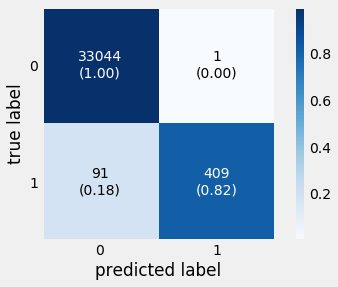

In [118]:
predictions = []
for i in df:
    predictions.append(predict(clf, [i[1:]]))
    
y_true = []
y_pred = []
for i in np.arange(len(predictions)):
    y_pred.append(predictions[i][0])
    y_true.append(df[i][0])

y_true, y_pred

cf = confusion_matrix(y_true, y_pred)
tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
tn, fp, fn, tp

fig, ax = plot_confusion_matrix(conf_mat=cf,           
                                show_absolute=True,
                                show_normed=True,
                                colorbar=True)
plt.show()

# Test the un-optimized algorithm on the Testing Data

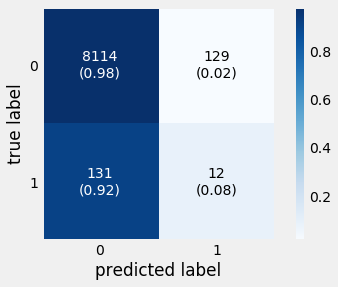

In [149]:
df = testing_df.to_numpy()
X = df[:, 1:]
Y = df[:, 0]
Y=Y.astype('int')

predictions = []
for i in df:
    predictions.append(predict(clf, [i[1:]]))
    
y_true = []
y_pred = []
for i in np.arange(len(predictions)):
    y_pred.append(predictions[i][0])
    y_true.append(df[i][0])

y_true, y_pred

cf = confusion_matrix(y_true, y_pred)
tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
tn, fp, fn, tp

fig, ax = plot_confusion_matrix(conf_mat=cf,           
                                show_absolute=True,
                                show_normed=True,
                                colorbar=True)
plt.show()

In [121]:
from itertools import chain, combinations

def powerset(iterable):
    "powerset([1,2,3]) --> () (1,) (2,) (3,) (1,2) (1,3) (2,3) (1,2,3)"
    s = list(iterable)
    return chain.from_iterable(combinations(s, r) for r in range(len(s)+1))

list_of_combinations = list(powerset([1,2,3,4,5,6]))
list_of_combinations = list_of_combinations[1:]
list_of_combinations

[(1,),
 (2,),
 (3,),
 (4,),
 (5,),
 (6,),
 (1, 2),
 (1, 3),
 (1, 4),
 (1, 5),
 (1, 6),
 (2, 3),
 (2, 4),
 (2, 5),
 (2, 6),
 (3, 4),
 (3, 5),
 (3, 6),
 (4, 5),
 (4, 6),
 (5, 6),
 (1, 2, 3),
 (1, 2, 4),
 (1, 2, 5),
 (1, 2, 6),
 (1, 3, 4),
 (1, 3, 5),
 (1, 3, 6),
 (1, 4, 5),
 (1, 4, 6),
 (1, 5, 6),
 (2, 3, 4),
 (2, 3, 5),
 (2, 3, 6),
 (2, 4, 5),
 (2, 4, 6),
 (2, 5, 6),
 (3, 4, 5),
 (3, 4, 6),
 (3, 5, 6),
 (4, 5, 6),
 (1, 2, 3, 4),
 (1, 2, 3, 5),
 (1, 2, 3, 6),
 (1, 2, 4, 5),
 (1, 2, 4, 6),
 (1, 2, 5, 6),
 (1, 3, 4, 5),
 (1, 3, 4, 6),
 (1, 3, 5, 6),
 (1, 4, 5, 6),
 (2, 3, 4, 5),
 (2, 3, 4, 6),
 (2, 3, 5, 6),
 (2, 4, 5, 6),
 (3, 4, 5, 6),
 (1, 2, 3, 4, 5),
 (1, 2, 3, 4, 6),
 (1, 2, 3, 5, 6),
 (1, 2, 4, 5, 6),
 (1, 3, 4, 5, 6),
 (2, 3, 4, 5, 6),
 (1, 2, 3, 4, 5, 6)]

In [122]:
def make_the_df(df, combination):
    combination[:0] = [0]
    new_df = df.iloc[:, combination]
    return new_df

#test
make_the_df(training_df, [1,2,3,5])

,stroke,gender,age,hypertension,bmi
20437,0,0,-0.897799,0,1.067573
12282,0,1,-0.586956,0,-0.592675
14795,0,1,0.478792,0,0.321105
13174,0,1,-1.785923,0,-1.223311
1812,0,1,1.322509,0,0.218144
...,...,...,...,...,...
23633,0,0,-0.187301,0,-0.631285
8925,0,0,0.389980,0,-0.566934
19966,0,0,1.366916,0,0.488417
11494,0,0,0.745229,0,-0.708506


In [131]:
%%time
import time

def optimize(df):
    start = time.time()
    def predict(clf, array_of_inputs):
        return clf.predict(array_of_inputs)
    
    accuracy_rates = []
    n=0
    for combination in list_of_combinations:
        new_df = make_the_df(df, list(combination))
        new_df_sampled = new_df.sample(frac=1)
        training_df=new_df_sampled.iloc[0:33545]
        testing_df=new_df_sampled.iloc[33545:]

        training_df = training_df.to_numpy()
        X2 = training_df[:, 1:]
        Y2 = training_df[:, 0]
        Y2=Y2.astype('int')

        clf2 = tree.DecisionTreeClassifier()
        clf2 = clf2.fit(X2, Y2)
    
        testing_df = testing_df.to_numpy()
        predictions = []
        for i in testing_df:
            predictions.append(predict(clf2, [i[1:]]))

        correct_count = 0
        for i in np.arange(len(predictions)):
            if predictions[i][0] == testing_df[i][0]:
                correct_count += 1

        accuracy = correct_count/len(predictions)
        print(str(time.time()-start) + "seconds")
        n+=1
        print(n)
        accuracy_rates.append([accuracy, combination])
        print([accuracy, list(combination)])
    
    return accuracy_rates


Wall time: 0 ns


In [139]:
accuracy_rates = optimize(usa)

2.017085075378418seconds
1
[0.984855711900787, [1]]
3.7690911293029785seconds
2
[0.9839017409968996, [2]]
5.557758331298828seconds
3
[0.9850942046267589, [3]]
7.710530757904053seconds
4
[0.9842594800858574, [4]]
10.31072187423706seconds
5
[0.9842594800858574, [5]]
11.814042806625366seconds
6
[0.9852134509897448, [6]]
14.205336093902588seconds
7
[0.9843787264488433, [1, 2]]
16.537707328796387seconds
8
[0.9853326973527308, [1, 3]]
19.063345193862915seconds
9
[0.9840209873598855, [1, 4]]
20.529111862182617seconds
10
[0.9861674218936323, [1, 5]]
21.92853593826294seconds
11
[0.9847364655378011, [1, 6]]
23.308299779891968seconds
12
[0.9847364655378011, [2, 3]]
24.587995052337646seconds
13
[0.9810398282852373, [2, 4]]
26.199166774749756seconds
14
[0.9769854519437157, [2, 5]]
27.583388090133667seconds
15
[0.9849749582637729, [2, 6]]
28.74228310585022seconds
16
[0.9833055091819699, [3, 4]]
29.90028476715088seconds
17
[0.984855711900787, [3, 5]]
30.933967351913452seconds
18
[0.9829477700930122, 

In [140]:
accuracy_rates

[[0.984855711900787, (1,)],
 [0.9839017409968996, (2,)],
 [0.9850942046267589, (3,)],
 [0.9842594800858574, (4,)],
 [0.9842594800858574, (5,)],
 [0.9852134509897448, (6,)],
 [0.9843787264488433, (1, 2)],
 [0.9853326973527308, (1, 3)],
 [0.9840209873598855, (1, 4)],
 [0.9861674218936323, (1, 5)],
 [0.9847364655378011, (1, 6)],
 [0.9847364655378011, (2, 3)],
 [0.9810398282852373, (2, 4)],
 [0.9769854519437157, (2, 5)],
 [0.9849749582637729, (2, 6)],
 [0.9833055091819699, (3, 4)],
 [0.984855711900787, (3, 5)],
 [0.9829477700930122, (3, 6)],
 [0.9870021464345338, (4, 5)],
 [0.9860481755306463, (4, 6)],
 [0.9835440019079418, (5, 6)],
 [0.9861674218936323, (1, 2, 3)],
 [0.9841402337228714, (1, 2, 4)],
 [0.976508466491772, (1, 2, 5)],
 [0.9864059146196041, (1, 2, 6)],
 [0.9862866682566181, (1, 3, 4)],
 [0.983186262818984, (1, 3, 5)],
 [0.9837824946339137, (1, 3, 6)],
 [0.9846172191748152, (1, 4, 5)],
 [0.9861674218936323, (1, 4, 6)],
 [0.9854519437157166, (1, 5, 6)],
 [0.983186262818984, (2, 

In [148]:
accuracy_rates.sort(reverse = True)
accuracy_rates

[[0.9872406391605056, (3, 4, 6)],
 [0.9870021464345338, (4, 5)],
 [0.9864059146196041, (1, 2, 6)],
 [0.9862866682566181, (1, 3, 4)],
 [0.9861674218936323, (1, 5)],
 [0.9861674218936323, (1, 4, 6)],
 [0.9861674218936323, (1, 2, 3)],
 [0.9860481755306463, (4, 6)],
 [0.9858096828046744, (1, 2, 3, 4, 6)],
 [0.9856904364416885, (3, 4, 5)],
 [0.9856904364416885, (1, 2, 3, 6)],
 [0.9854519437157166, (1, 5, 6)],
 [0.9853326973527308, (1, 3)],
 [0.9853326973527308, (1, 2, 4, 6)],
 [0.9853326973527308, (1, 2, 3, 4)],
 [0.9852134509897448, (6,)],
 [0.9850942046267589, (3,)],
 [0.9850942046267589, (2, 4, 6)],
 [0.9849749582637729, (2, 6)],
 [0.984855711900787, (3, 5)],
 [0.984855711900787, (1,)],
 [0.9847364655378011, (2, 3)],
 [0.9847364655378011, (1, 6)],
 [0.9846172191748152, (1, 4, 5)],
 [0.9844979728118293, (4, 5, 6)],
 [0.9843787264488433, (1, 2)],
 [0.9842594800858574, (5,)],
 [0.9842594800858574, (4,)],
 [0.9841402337228714, (1, 3, 4, 5)],
 [0.9841402337228714, (1, 2, 4)],
 [0.984020987359

In [142]:
%%time
import time

def optimize_confusion_matrix(df):
    start = time.time()
    def predict(clf, array_of_inputs):
        return clf.predict(array_of_inputs)
    
    confusion_rates = []
    n=0
    for combination in list_of_combinations:
        new_df = make_the_df(df, list(combination))
        new_df_sampled = new_df.sample(frac=1)
        training_df=new_df_sampled.iloc[0:33545]
        testing_df=new_df_sampled.iloc[33545:]

        training_df = training_df.to_numpy()
        X2 = training_df[:, 1:]
        Y2 = training_df[:, 0]
        Y2=Y2.astype('int')

        clf2 = tree.DecisionTreeClassifier()
        clf2 = clf2.fit(X2, Y2)
    
        testing_df = testing_df.to_numpy()
        predictions = []
        for i in testing_df:
            predictions.append(predict(clf2, [i[1:]]))
            

    
        y_true = []
        y_pred = []
        for i in np.arange(len(predictions)):
            y_pred.append(predictions[i][0])
            y_true.append(testing_df[i][0])

        y_true, y_pred

        cf = confusion_matrix(y_true, y_pred)
        tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
        confusion_rates.append([tn, fp, fn, tp], combination)
    
    return confusion_rates


Wall time: 0 ns


In [144]:
confusion_rates = optimize_confusion_matrix(usa)

8263 0 123 0
8235 0 151 0
8231 0 155 0
8267 0 119 0
8265 0 121 0
8268 0 118 0
8267 0 119 0
8239 0 147 0
8276 0 110 0
8239 0 147 0
8280 0 106 0
8254 0 132 0
8260 0 126 0
8210 54 122 0
8243 0 143 0
8259 0 127 0
8243 1 142 0
8228 0 158 0
8264 4 117 1
8261 0 125 0
8249 1 136 0
8252 0 134 0
8267 0 119 0
8189 85 105 7
8262 0 124 0
8251 0 135 0
8266 8 112 0
8262 0 124 0
8237 9 139 1
8236 0 150 0
8256 1 129 0
8254 0 132 0
8179 69 135 3
8263 0 123 0
8196 59 129 2
8245 0 141 0
8180 77 126 3
8233 7 146 0
8237 0 149 0
8249 3 134 0
8265 5 115 1
8249 2 135 0
8174 90 118 4
8265 0 121 0
8153 116 112 5
8249 2 135 0
8164 106 110 6
8249 12 121 4
8269 0 117 0
8250 10 126 0
8244 13 128 1
8159 90 129 8
8240 1 145 0
8160 96 127 3
8154 98 131 3
8237 11 136 2
8169 92 121 4
8233 5 148 0
8139 124 115 8
8128 132 117 9
8251 26 107 2
8097 141 137 11
8124 128 119 15


[[8263, 0, 123, 0],
 [8235, 0, 151, 0],
 [8231, 0, 155, 0],
 [8267, 0, 119, 0],
 [8265, 0, 121, 0],
 [8268, 0, 118, 0],
 [8267, 0, 119, 0],
 [8239, 0, 147, 0],
 [8276, 0, 110, 0],
 [8239, 0, 147, 0],
 [8280, 0, 106, 0],
 [8254, 0, 132, 0],
 [8260, 0, 126, 0],
 [8210, 54, 122, 0],
 [8243, 0, 143, 0],
 [8259, 0, 127, 0],
 [8243, 1, 142, 0],
 [8228, 0, 158, 0],
 [8264, 4, 117, 1],
 [8261, 0, 125, 0],
 [8249, 1, 136, 0],
 [8252, 0, 134, 0],
 [8267, 0, 119, 0],
 [8189, 85, 105, 7],
 [8262, 0, 124, 0],
 [8251, 0, 135, 0],
 [8266, 8, 112, 0],
 [8262, 0, 124, 0],
 [8237, 9, 139, 1],
 [8236, 0, 150, 0],
 [8256, 1, 129, 0],
 [8254, 0, 132, 0],
 [8179, 69, 135, 3],
 [8263, 0, 123, 0],
 [8196, 59, 129, 2],
 [8245, 0, 141, 0],
 [8180, 77, 126, 3],
 [8233, 7, 146, 0],
 [8237, 0, 149, 0],
 [8249, 3, 134, 0],
 [8265, 5, 115, 1],
 [8249, 2, 135, 0],
 [8174, 90, 118, 4],
 [8265, 0, 121, 0],
 [8153, 116, 112, 5],
 [8249, 2, 135, 0],
 [8164, 106, 110, 6],
 [8249, 12, 121, 4],
 [8269, 0, 117, 0],
 [8250, 1

In [145]:
confusion_rates

[[8263, 0, 123, 0],
 [8235, 0, 151, 0],
 [8231, 0, 155, 0],
 [8267, 0, 119, 0],
 [8265, 0, 121, 0],
 [8268, 0, 118, 0],
 [8267, 0, 119, 0],
 [8239, 0, 147, 0],
 [8276, 0, 110, 0],
 [8239, 0, 147, 0],
 [8280, 0, 106, 0],
 [8254, 0, 132, 0],
 [8260, 0, 126, 0],
 [8210, 54, 122, 0],
 [8243, 0, 143, 0],
 [8259, 0, 127, 0],
 [8243, 1, 142, 0],
 [8228, 0, 158, 0],
 [8264, 4, 117, 1],
 [8261, 0, 125, 0],
 [8249, 1, 136, 0],
 [8252, 0, 134, 0],
 [8267, 0, 119, 0],
 [8189, 85, 105, 7],
 [8262, 0, 124, 0],
 [8251, 0, 135, 0],
 [8266, 8, 112, 0],
 [8262, 0, 124, 0],
 [8237, 9, 139, 1],
 [8236, 0, 150, 0],
 [8256, 1, 129, 0],
 [8254, 0, 132, 0],
 [8179, 69, 135, 3],
 [8263, 0, 123, 0],
 [8196, 59, 129, 2],
 [8245, 0, 141, 0],
 [8180, 77, 126, 3],
 [8233, 7, 146, 0],
 [8237, 0, 149, 0],
 [8249, 3, 134, 0],
 [8265, 5, 115, 1],
 [8249, 2, 135, 0],
 [8174, 90, 118, 4],
 [8265, 0, 121, 0],
 [8153, 116, 112, 5],
 [8249, 2, 135, 0],
 [8164, 106, 110, 6],
 [8249, 12, 121, 4],
 [8269, 0, 117, 0],
 [8250, 1

We learn from the above analysis that including all the columns generate the lowest prediction accuracy, but also the best true positive rate. We include all columns, for our final model.

Accuracy: 96.9%
Confusion Matrix: Plotted below

Likely the reason for poor prediction of True Positive is because the training dataset has overwhelmingly many stroke cases compared to non-stroke cases. There is room for further discussion on this matter.

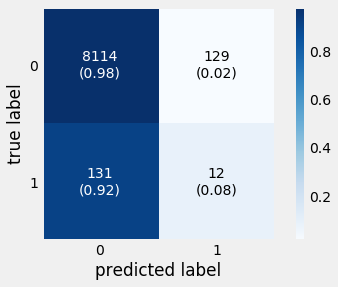

In [158]:
df = testing_df.to_numpy()
X = df[:, 1:]
Y = df[:, 0]
Y=Y.astype('int')

predictions = []
for i in df:
    predictions.append(predict(clf, [i[1:]]))
    
y_true = []
y_pred = []
for i in np.arange(len(predictions)):
    y_pred.append(predictions[i][0])
    y_true.append(df[i][0])

y_true, y_pred

cf = confusion_matrix(y_true, y_pred)
tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
tn, fp, fn, tp

fig, ax = plot_confusion_matrix(conf_mat=cf,           
                                show_absolute=True,
                                show_normed=True,
                                colorbar=True)
plt.show()

In [159]:

clf2 = tree.DecisionTreeClassifier()
clf2 = clf2.fit(X, Y)

In [162]:
from sklearn.model_selection import cross_val_score

dt_scores = cross_val_score(clf2, X, Y, cv = 5)
print("mean cross validation score: {}".format(np.mean(dt_scores)))
print("score without cv: {}".format(clf2.score(X, Y)))

mean cross validation score: 0.9633911833897042
score without cv: 0.9991652754590985
